# Background

- Use this notebook to keep an eye on the Hall probe calibration scan data.

# Imports

In [1]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [2]:
import numpy as np
import pandas as pd
from copy import deepcopy
import pickle as pkl
from plotly import graph_objects as go
from plotly.offline import plot, iplot
import matplotlib.pyplot as plt
%matplotlib inline

# local imports
from plotting import config_plots, get_label
from load_slow import *
from monitor_funcs import *

config_plots()

# File Info

In [3]:
ddir = '/home/ckampa/Dropbox/LogFiles/' # anyone should be able to read from here
scanfile = ddir+'2025-05-23 143544.txt' # scan data, with SmarAct motors and Hall probe
slowfile = ddir+'2025-05-22 160240slow.txt' # slow scan data, with temperatures, NMR, magnet PS voltage and current

# Load and Process Data

In [4]:
# temperature (slow scan)
df_temp = load_data(slowfile)
df_temp0 = df_temp.copy() # make a copy for plotting the full range
# only include times with NMR?
#df_temp = df_temp.query('`NMR [T]` > 0.9').copy()
# scan data
df = load_data(scanfile).iloc[1:]
# interpolations from temp to scan
for col in ['NMR [T]']:
    df = interp_temp_col(df_temp, df, col=col)
# find the Hall probe
probes = get_probe_IDs(df)
probe = probes[0]
df = Hall_probe_basic_calcs(df, probes) # calculate e.g. |B|
smar_cols = [c for c in df.columns if "SmarAct" in c]
df0 = df.copy()

In [5]:
probe

'C50000000D5E473A'

In [6]:
# inspect dataframes

In [7]:
df0

,Time,Magnet Current [A],Magnet Voltage [V],NMR [T],NMR [FFT],C50000000D5E473A_Raw_X,C50000000D5E473A_Raw_Y,C50000000D5E473A_Raw_Z,C50000000D5E473A_Raw_T,C50000000D5E473A_Cal_X,...,C50000000D5E473A_Cal_Bmag,C50000000D5E473A_Cal_Theta,C50000000D5E473A_Cal_Phi,C50000000D5E473A_Cal_Theta2,C50000000D5E473A_Cal_Phi2,Magnet Resistance [Ohm],Coil Resistance [Ohm],Magnet Power [W],SmarAct_Meas_Angle_1_Centered,SmarAct_Meas_Angle_2_Centered
Datetime,,,,,,,,,,,,,,,,,,,,,
2025-05-23 15:48:39,5/23/2025 3:48:39 PM,0.0,0.0,0.752453,0.0,36310.0,-44492.0,2152404.0,16627.0,-0.751786,...,0.751906,1.580780,-3.126752,3.123707,-2.549380,NaN,NaN,0.0,-1.000007,-4.050000e-07
2025-05-23 15:48:40,5/23/2025 3:48:40 PM,0.0,0.0,0.752453,0.0,36166.0,-44496.0,2152479.0,16625.0,-0.751811,...,0.751931,1.580708,-3.126751,3.123745,-2.552759,NaN,NaN,0.0,-1.000000,-2.540000e-07
2025-05-23 15:48:42,5/23/2025 3:48:42 PM,0.0,0.0,0.752453,0.0,36120.0,-44551.0,2152464.0,16620.0,-0.751805,...,0.751924,1.580686,-3.126724,3.123736,-2.554648,NaN,NaN,0.0,-1.000003,-9.970000e-07
2025-05-23 15:48:50,5/23/2025 3:48:50 PM,0.0,0.0,0.752453,0.0,24268.0,-43993.0,2152486.0,16576.0,-0.751827,...,0.751914,1.574861,-3.126937,3.126384,-2.871065,NaN,NaN,0.0,-0.999995,1.500001e+01
2025-05-23 15:48:51,5/23/2025 3:48:51 PM,0.0,0.0,0.752454,0.0,24370.0,-44190.0,2152490.0,16563.0,-0.751824,...,0.751912,1.574910,-3.126842,3.126279,-2.869591,NaN,NaN,0.0,-0.999998,1.500000e+01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-05-24 05:28:54,5/24/2025 5:28:54 AM,0.0,0.0,0.752389,0.0,-280412.0,379996.0,2067537.0,32967.0,-0.730176,...,0.751887,1.425309,2.948908,2.900696,0.653129,NaN,NaN,0.0,13.999999,-1.500000e+01
2025-05-24 05:28:56,5/24/2025 5:28:56 AM,0.0,0.0,0.752389,0.0,-280464.0,379949.0,2067537.0,32974.0,-0.730178,...,0.751889,1.425282,2.948931,2.900698,0.653275,NaN,NaN,0.0,14.000000,-1.500000e+01
2025-05-24 05:29:03,5/24/2025 5:29:03 AM,0.0,0.0,0.752389,0.0,-175074.0,447457.0,2065787.0,32942.0,-0.729671,...,0.751880,1.478057,2.915950,2.897935,0.393970,NaN,NaN,0.0,13.999998,5.334000e-06


In [8]:
df_temp0

,Time,Magnet Current [A],Magnet Voltage [V],Coil 1,Coil 2,LCW in Coil1,LCW out Coil 1,LCW in Coil 2,LCW out Coil 2,Yoke (near pole),...,Return Magnet (NWC-R),Chiller Exhaust (NW),Supply Magnet (NWC-S),NaN (NWC-S),Supply PS (FNAL),NMR [T],NMR [FFT],seconds_delta,hours_delta,days_delta
Datetime,,,,,,,,,,,,,,,,,,,,,
2025-05-22 16:02:41,5/22/2025 4:02:41 PM,131.238073,14.955305,19.168934,18.948118,12.931243,13.900417,14.096674,13.960869,17.796627,...,14.454735,25.032274,13.515466,18.006378,23.107811,0.752436,0.0,0.0,0.000000,0.000000
2025-05-22 16:03:16,5/22/2025 4:03:16 PM,131.236883,14.972312,19.335047,19.093056,13.224684,14.149738,14.258928,14.227720,17.785265,...,14.635222,25.007534,13.691942,17.998705,23.111427,0.752436,0.0,35.0,0.009722,0.000405
2025-05-22 16:08:16,5/22/2025 4:08:16 PM,131.237450,15.025210,20.109388,19.808691,12.538976,13.735240,13.674243,13.851610,17.727846,...,14.266280,27.374483,13.032712,18.061644,23.231268,0.752437,0.0,335.0,0.093056,0.003877
2025-05-22 16:13:16,5/22/2025 4:13:16 PM,131.236317,15.065120,20.699867,20.359917,11.948339,13.450710,13.269759,13.563798,17.673056,...,14.160304,28.983746,12.510507,18.254355,23.467737,0.752438,0.0,635.0,0.176389,0.007350
2025-05-22 16:18:16,5/22/2025 4:18:16 PM,131.232010,15.094090,21.089727,20.704052,12.876473,14.397882,13.922293,14.465106,17.629160,...,15.417857,31.362980,12.660399,18.322323,23.806744,0.752439,0.0,935.0,0.259722,0.010822
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-05-28 15:28:37,5/28/2025 3:28:37 PM,131.238300,15.143713,21.857008,21.262672,12.939336,14.262987,13.504138,14.570641,15.907897,...,14.894812,26.788714,13.482637,18.155495,31.540772,0.000000,0.0,516356.0,143.432222,5.976343
2025-05-28 15:33:21,5/28/2025 3:33:21 PM,131.238300,15.143267,21.870468,21.272121,12.348707,13.819385,13.127030,14.089009,15.904660,...,14.483769,27.520887,12.941256,18.164503,31.609068,0.000000,0.0,516640.0,143.511111,5.979630
2025-05-28 15:38:37,5/28/2025 3:38:37 PM,131.238187,15.144520,21.891884,21.298977,12.040101,13.627281,12.961009,13.867252,15.906446,...,14.300371,28.492289,12.643215,18.182756,31.541164,0.000000,0.0,516956.0,143.598889,5.983287


# Monitor

## Inspect a run

- You can also look at the interactive plotly plot with the SmarAct angles in the next section to find the right t0 and tf

In [9]:
# time cut definition for inspecting a run. once you find 15 deg run window, you can trivially get others by adding in 3 hour increments
t0 = '05-24-25 03:40'
tf = '05-24-25 05:35'

In [10]:
# time slice for inspecting a run
df = df.query(f'"{t0}" <= Datetime <= "{tf}"').copy()
df_temp = df_temp.query(f'"{t0}" <= Datetime <= "{tf}"').copy()
# match the time range of slow scan to the scan dataframe
df_t = match_temp_scan_dfs(df_temp, df)

In [11]:
# inspect dataframes to make sure your query worked (or look at df lengths)

In [12]:
len(df), len(df_t)

(1197, 20)

In [13]:
df

,Time,Magnet Current [A],Magnet Voltage [V],NMR [T],NMR [FFT],C50000000D5E473A_Raw_X,C50000000D5E473A_Raw_Y,C50000000D5E473A_Raw_Z,C50000000D5E473A_Raw_T,C50000000D5E473A_Cal_X,...,C50000000D5E473A_Cal_Bmag,C50000000D5E473A_Cal_Theta,C50000000D5E473A_Cal_Phi,C50000000D5E473A_Cal_Theta2,C50000000D5E473A_Cal_Phi2,Magnet Resistance [Ohm],Coil Resistance [Ohm],Magnet Power [W],SmarAct_Meas_Angle_1_Centered,SmarAct_Meas_Angle_2_Centered
Datetime,,,,,,,,,,,,,,,,,,,,,
2025-05-24 03:48:58,5/24/2025 3:48:58 AM,0.0,0.0,0.752417,0.0,17538.0,-41100.0,2138159.0,32724.0,-0.751807,...,0.751876,1.571358,-3.128013,3.128002,-3.100266,NaN,NaN,0.0,-0.999998,15.000007
2025-05-24 03:49:00,5/24/2025 3:49:00 AM,0.0,0.0,0.752417,0.0,17616.0,-41112.0,2138194.0,32749.0,-0.751826,...,0.751896,1.571396,-3.128008,3.127995,-3.097491,NaN,NaN,0.0,-1.000003,15.000000
2025-05-24 03:49:02,5/24/2025 3:49:02 AM,0.0,0.0,0.752417,0.0,17461.0,-41202.0,2138075.0,32769.0,-0.751791,...,0.751861,1.571319,-3.127962,3.127952,-3.103266,NaN,NaN,0.0,-1.000005,14.999999
2025-05-24 03:49:09,5/24/2025 3:49:09 AM,0.0,0.0,0.752417,0.0,7045.0,-35980.0,2138101.0,32769.0,-0.751848,...,0.751902,1.566185,-3.130451,3.129535,2.749123,NaN,NaN,0.0,-0.999999,30.000004
2025-05-24 03:49:11,5/24/2025 3:49:11 AM,0.0,0.0,0.752417,0.0,7052.0,-36016.0,2138038.0,32752.0,-0.751821,...,0.751875,1.566188,-3.130433,3.129520,2.749974,NaN,NaN,0.0,-1.000000,30.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-05-24 05:28:54,5/24/2025 5:28:54 AM,0.0,0.0,0.752389,0.0,-280412.0,379996.0,2067537.0,32967.0,-0.730176,...,0.751887,1.425309,2.948908,2.900696,0.653129,NaN,NaN,0.0,13.999999,-15.000002
2025-05-24 05:28:56,5/24/2025 5:28:56 AM,0.0,0.0,0.752389,0.0,-280464.0,379949.0,2067537.0,32974.0,-0.730178,...,0.751889,1.425282,2.948931,2.900698,0.653275,NaN,NaN,0.0,14.000000,-15.000000
2025-05-24 05:29:03,5/24/2025 5:29:03 AM,0.0,0.0,0.752389,0.0,-175074.0,447457.0,2065787.0,32942.0,-0.729671,...,0.751880,1.478057,2.915950,2.897935,0.393970,NaN,NaN,0.0,13.999998,0.000005


In [14]:
df_t

,Time,Magnet Current [A],Magnet Voltage [V],Coil 1,Coil 2,LCW in Coil1,LCW out Coil 1,LCW in Coil 2,LCW out Coil 2,Yoke (near pole),...,Return Magnet (NWC-R),Chiller Exhaust (NW),Supply Magnet (NWC-S),NaN (NWC-S),Supply PS (FNAL),NMR [T],NMR [FFT],seconds_delta,hours_delta,days_delta
Datetime,,,,,,,,,,,,,,,,,,,,,
2025-05-24 03:53:16,5/24/2025 3:53:16 AM,131.237620,15.226438,25.975000,25.148878,13.435247,16.115940,17.763620,15.585765,24.874258,...,14.996594,28.189993,13.103965,18.724411,30.936424,0.752331,0.0,129035.0,35.843056,1.493461
2025-05-24 03:58:16,5/24/2025 3:58:16 AM,131.237847,15.227700,26.019184,25.171240,13.166696,15.978936,17.584772,15.378558,24.969086,...,14.801463,28.141962,12.746420,18.651135,30.980476,0.752330,0.0,129335.0,35.926389,1.496933
2025-05-24 04:03:16,5/24/2025 4:03:16 AM,131.237677,15.229202,26.041866,25.240646,12.957854,15.844233,17.677805,15.216485,25.039373,...,14.731291,28.617735,12.503747,18.592287,30.936602,0.752327,0.0,129635.0,36.009722,1.500405
2025-05-24 04:08:16,5/24/2025 4:08:16 AM,131.237677,15.231582,26.068621,25.251011,12.804499,15.799594,17.594896,15.142657,25.129723,...,14.733055,29.472635,12.254744,18.532871,30.881557,0.752324,0.0,129935.0,36.093056,1.503877
2025-05-24 04:13:17,5/24/2025 4:13:17 AM,131.237620,15.233400,26.073717,25.284172,12.963634,16.086342,17.830931,15.338083,25.196276,...,15.271038,30.214930,12.052325,18.439442,30.885673,0.752323,0.0,130236.0,36.176667,1.507361
2025-05-24 04:18:17,5/24/2025 4:18:17 AM,131.231897,15.234487,26.088903,25.281162,13.957399,16.803692,18.373158,16.148441,25.280907,...,15.947653,30.811148,12.578046,18.386661,30.871410,0.752321,0.0,130536.0,36.260000,1.510833
2025-05-24 04:23:16,5/24/2025 4:23:16 AM,131.234673,15.234402,26.072575,25.258268,14.621183,17.030901,18.804422,16.641354,25.352163,...,15.942298,32.527096,13.786417,18.338142,30.855690,0.752319,0.0,130835.0,36.343056,1.514294
2025-05-24 04:28:17,5/24/2025 4:28:17 AM,131.237790,15.233043,26.048122,25.256754,14.493906,16.905336,18.677870,16.466566,25.422421,...,15.716320,26.429337,13.980334,18.271292,30.893417,0.752316,0.0,131136.0,36.426667,1.517778
2025-05-24 04:33:17,5/24/2025 4:33:17 AM,131.237847,15.231763,26.030220,25.273117,14.225760,16.679607,18.440519,16.265936,25.487524,...,15.474649,26.599192,13.726087,18.171686,30.858763,0.752315,0.0,131436.0,36.510000,1.521250


In [15]:
# basic numerical checks (B, temp, current)

In [16]:
df_t['NMR [T]'].mean()

0.7523132709

In [17]:
df[f'{probe}_Cal_Bmag'].mean()

0.7519159710918177

In [18]:
df[f'{probe}_Cal_Bmag'].tail()

Datetime
2025-05-24 05:28:54    0.751887
2025-05-24 05:28:56    0.751889
2025-05-24 05:29:03    0.751880
2025-05-24 05:29:05    0.751861
2025-05-24 05:29:06    0.751879
Name: C50000000D5E473A_Cal_Bmag, dtype: float64

In [19]:
df[f'{probe}_Cal_T'].mean()

32.949752715121136

In [20]:
df_t['Magnet Current [A]'].mean()

131.23688333334997

/home/ckampa/anaconda3/envs/mu2eBFit/lib/python3.10/site-packages/pandas/plotting/_matplotlib/core.py:981: UserWarning:

This axis already has a converter set and is updating to a potentially incompatible converter



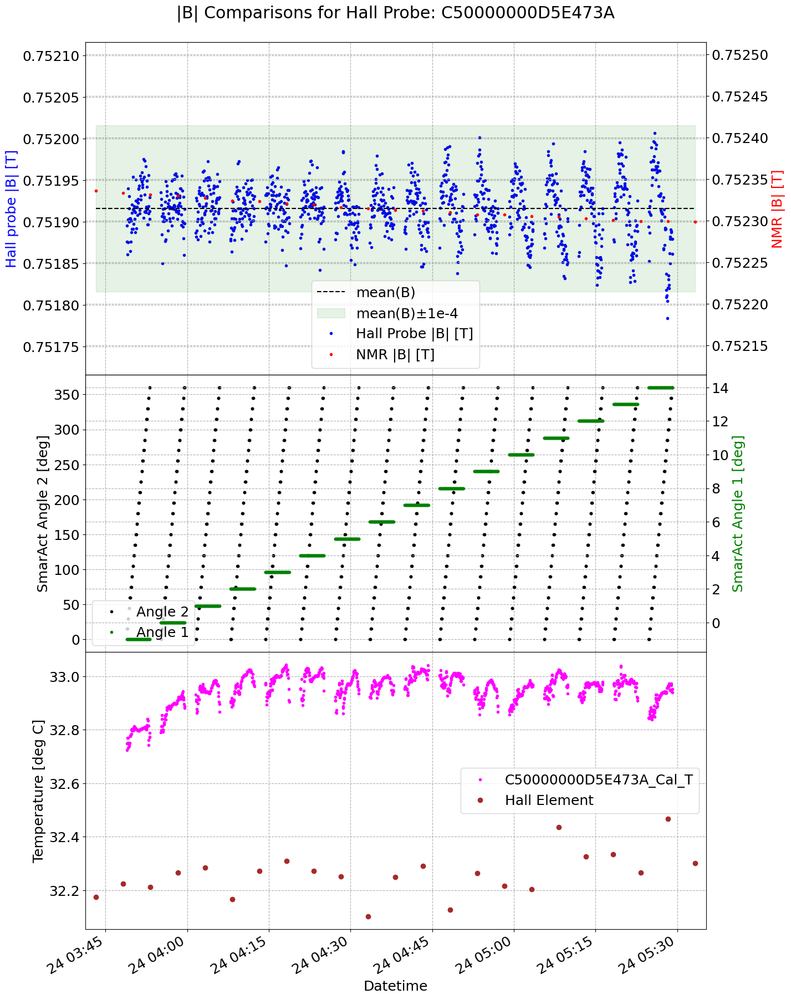

In [21]:
# run summary plot
fig, axs = make_run_plot_with_temp(df, df_temp, probe)

## Full Angular Scan File

- The interactive plot is useful for checking if SmarAct motors are misbehaving.

In [22]:
fig = make_SmarAct_plot_plotly(df0)

## Full Slow Scan File

- Plot temps, etc.

Most important temperatures to keep an eye on, aside from the Hall probe temperature, are the coils. If they get too hot the magnet will trip. The colorful bands are a bit conservative. The magnet probably won't trip unless you hit the very top of the red band.

You can also use this plot to check the chiller performance (source temp is the input to the magnet, return temp is after cooling the magnet)

There are a number of other temperatures in the file you might want to look at but usually aren't urgent to make sure the system is behaving well (Chamber Walls, ambient temp, power supply temps, ...). I didn't include a plot here.

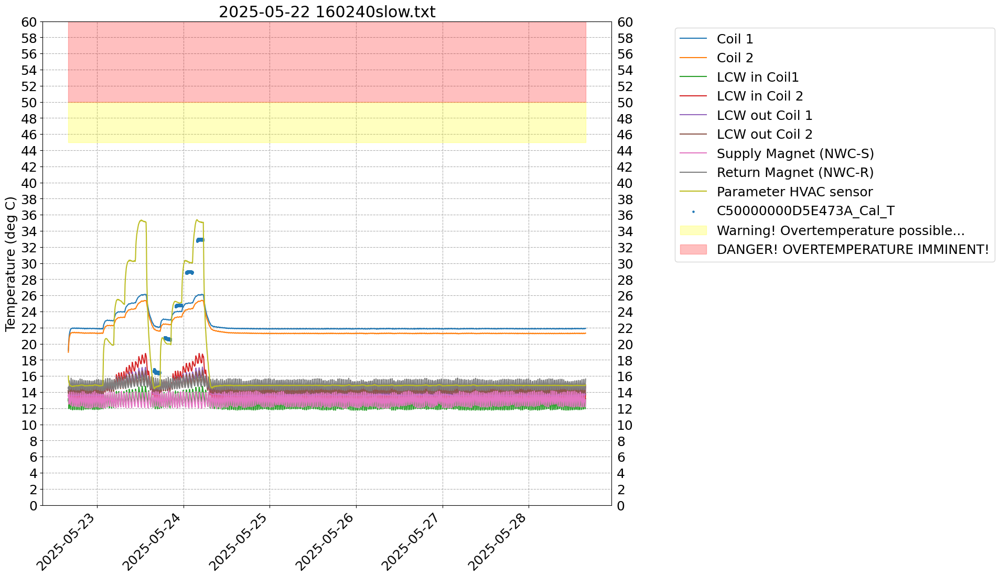

In [23]:
fig, ax = make_temps_plot(df_temp0, df0, probe, slowfile, plot_Hall_temp=True)

- Rough calculation of heat transferred from magnet is below. The magnet spec sheet suggests a power output of ~10 kW
with water cooling.
- We can also estimate the power of the magnet in-situ by calculating the Joule heating (from I and V measurements)

1. Look at temperature difference of glycol to and from the magnet

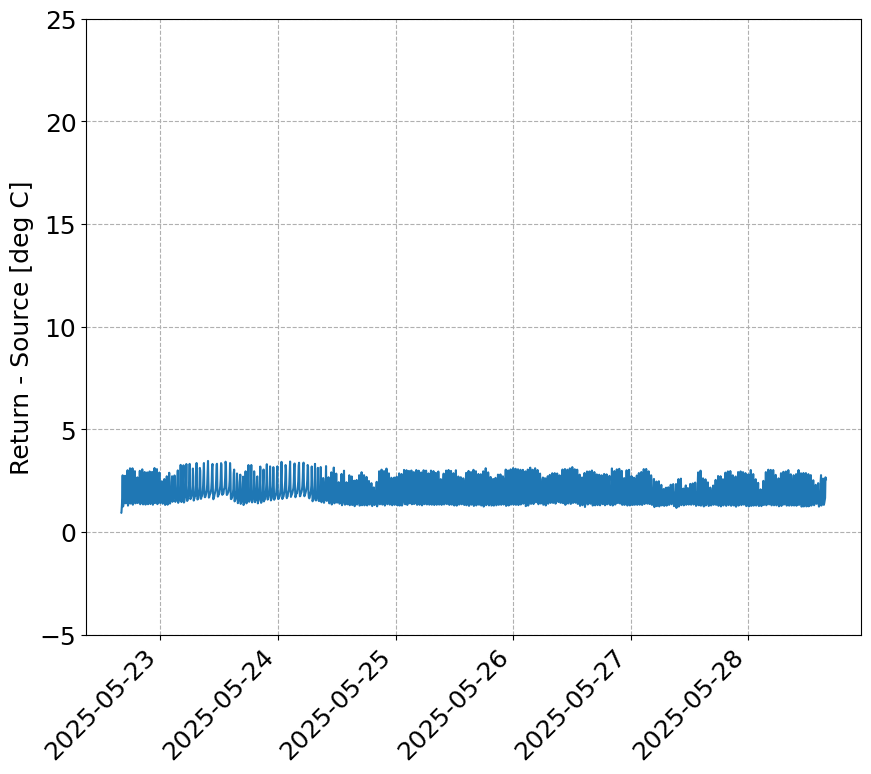

In [40]:
# delta temp, chiller side
fig, ax = plt.subplots()

ax.plot(df_temp0.index, df_temp0['Return Magnet (NWC-R)'] - df_temp0['Supply Magnet (NWC-S)'], label='NWU Chiller')

ax.set_ylim([-5., 25.])

ax.set_ylabel('Return - Source [deg C]')
ax.set_xticks(ax.get_xticks(), ax.get_xticklabels(), rotation=45, ha='right');

2. Estimation of heat transfer.
- Jinglu looked at flow rate (analog sensor on the back of the chiller): 7.75 GPM
- I guessed the glycol / H2O ratio (I know it is not pure glycol but I don't know the exact ratio).

In [25]:
flow_gpm = 7.75
lpg = 3.7854 # liters per gallon
flow_lps = (flow_gpm * lpg) / 60.
frac_glycol = 0.8 # this is a guess!! we can check with Thomas, I think he will know
density_gly = 1.113 # kg/l
density_h2o = 0.997 # kg/l
density_mix = frac_glycol * density_gly + (1.-frac_glycol) * density_h2o # kg / l
mass_flow_mix = density_mix * flow_lps * 1000 # g / s
specific_heat_gly = 2.4 # J/g deg C
specific_heat_h2o = 4.18 # J/g deg C
specific_heat_mix = frac_glycol * specific_heat_gly + (1. - frac_glycol) * specific_heat_h2o # J/g deg C
delta_T = (df_temp0['Return Magnet (NWC-R)'] - df_temp0['Supply Magnet (NWC-S)']).values # from the data
Q_kW = (mass_flow_mix * specific_heat_mix * delta_T) / 1000

In [26]:
Q_kW

array([1.37936208, 1.38525125, 1.81155453, ..., 2.43361369, 3.90673612,
       3.76147305])

4. Compare to magnet Joule heating

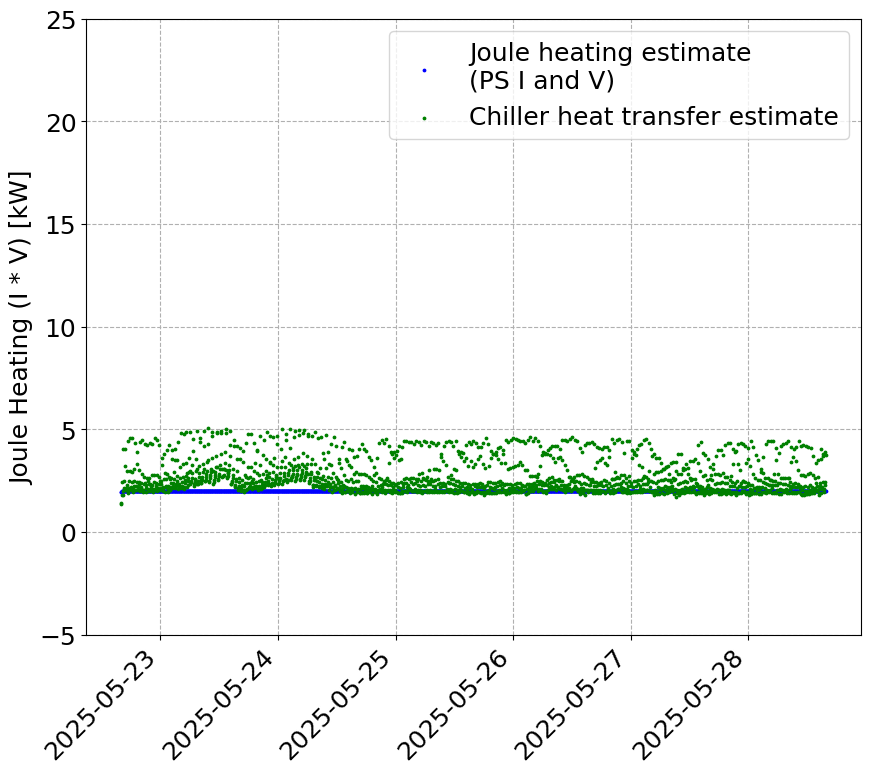

In [41]:
## magnet power
I = df_temp0['Magnet Current [A]'].values
V = df_temp0['Magnet Voltage [V]'].values
P = I * V
P_coil_approx = P / 2.

fig, ax = plt.subplots()

ax.scatter(df_temp0.index, P / 1000., s=3., color='blue', label='Joule heating estimate\n(PS I and V)')
ax.scatter(df_temp0.index, Q_kW, s=3., color='green', label='Chiller heat transfer estimate')

ax.legend()

ax.set_ylim([-5., 25.])

ax.set_ylabel('Joule Heating (I * V) [kW]')
ax.set_xticks(ax.get_xticks(), ax.get_xticklabels(), rotation=45, ha='right');

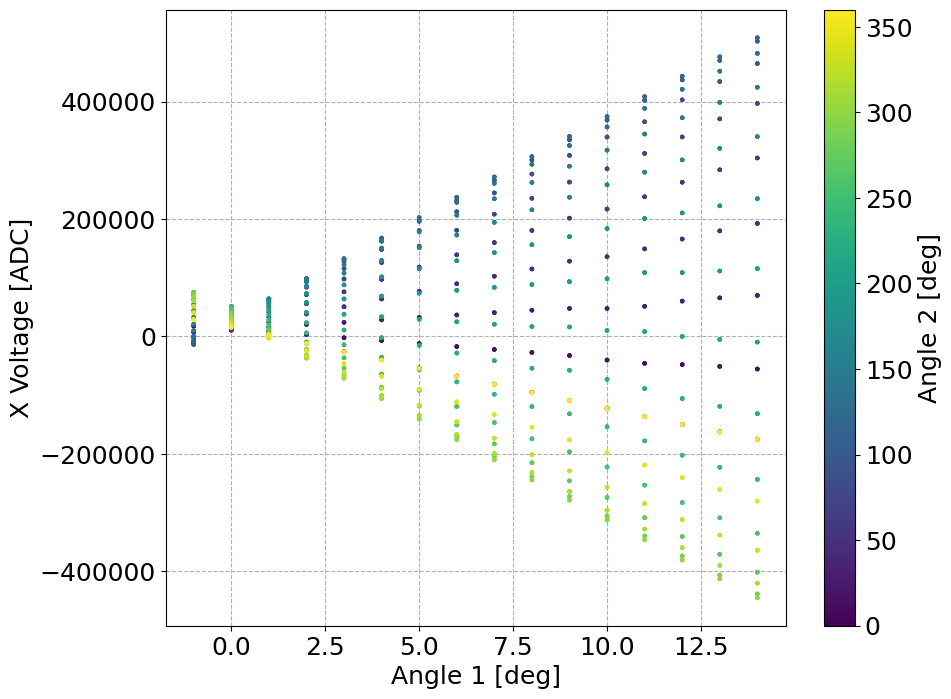

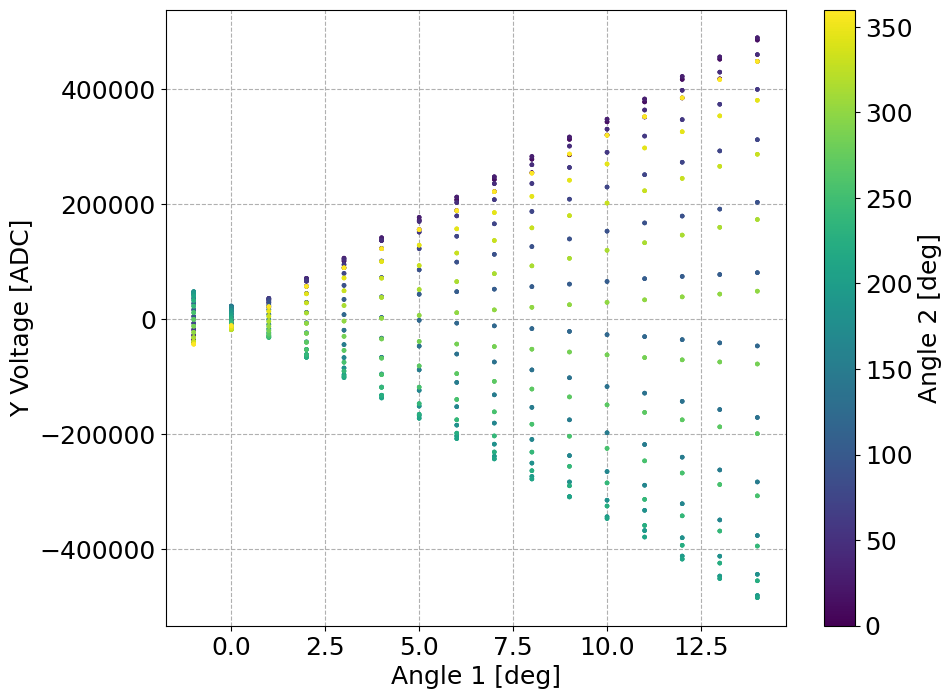

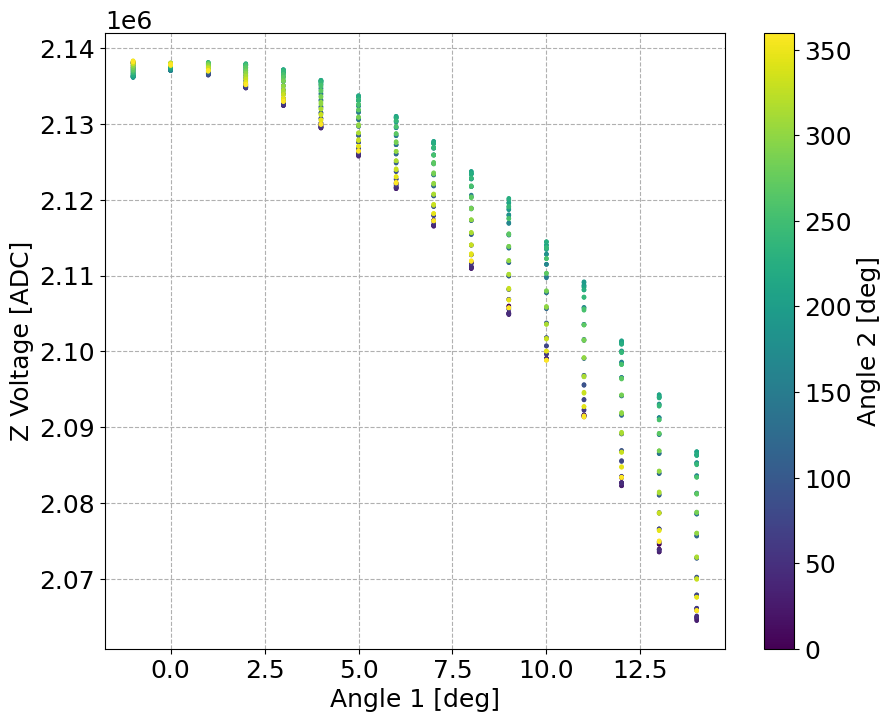

In [28]:
for B in ['X', 'Y', 'Z']:
    fig, ax = plt.subplots()
    
    sc = ax.scatter(df['SmarAct_Meas_Angle_1'], df[f'{probe}_Raw_{B}'], s=5, c=df['SmarAct_Meas_Angle_2'])
    cb = fig.colorbar(sc, label='Angle 2 [deg]')

    ax.set_xlabel('Angle 1 [deg]')
    ax.set_ylabel(f'{B} Voltage [ADC]')

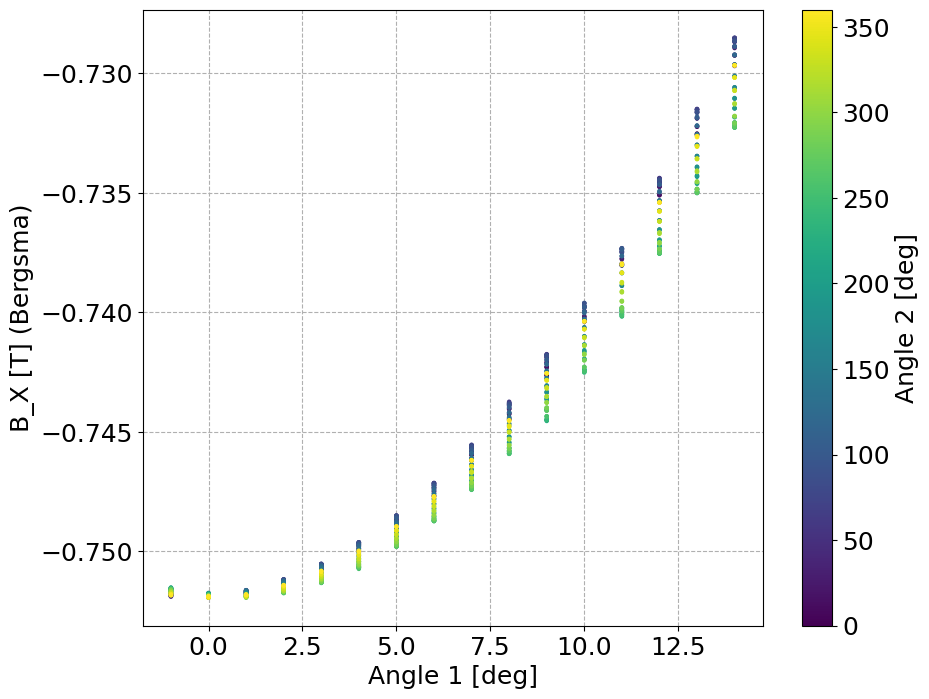

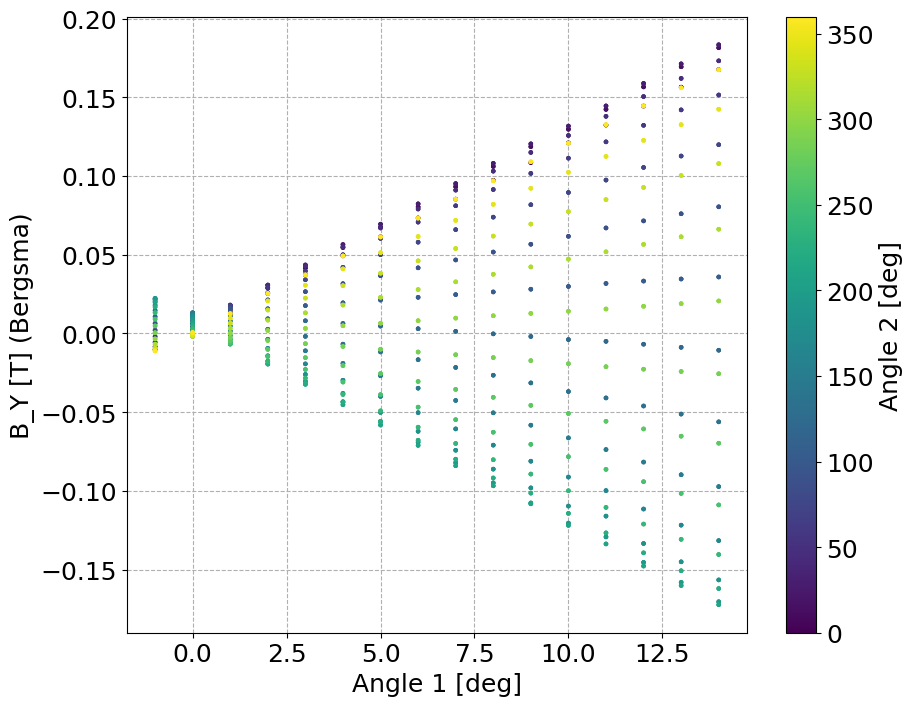

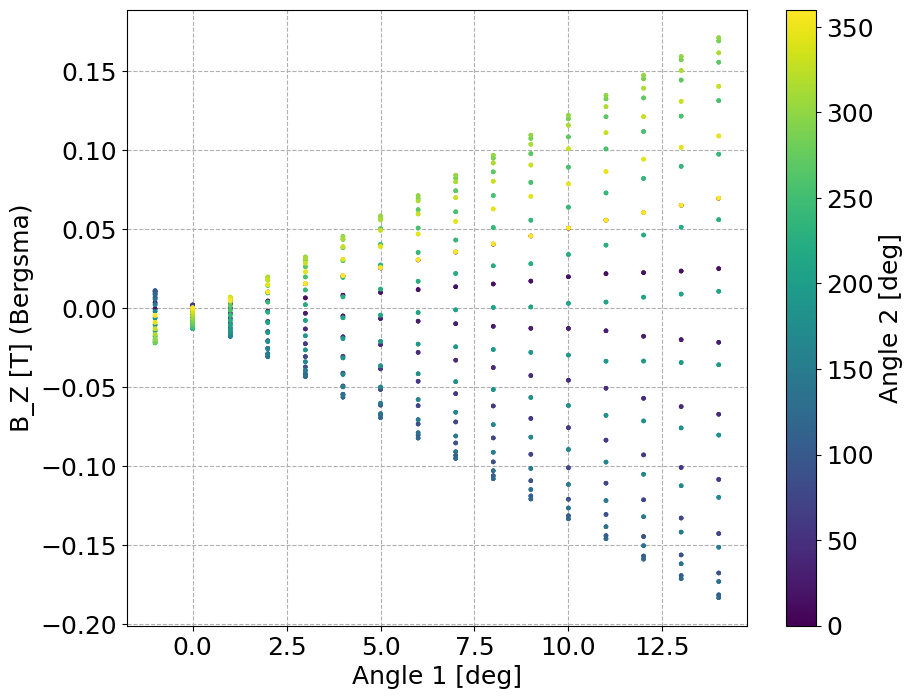

In [29]:
# CALIBRATED
for B in ['X', 'Y', 'Z']:
    fig, ax = plt.subplots()
    
    sc = ax.scatter(df['SmarAct_Meas_Angle_1'], df[f'{probe}_Cal_{B}'], s=5, c=df['SmarAct_Meas_Angle_2'])
    cb = fig.colorbar(sc, label='Angle 2 [deg]')

    ax.set_xlabel('Angle 1 [deg]')
    ax.set_ylabel(f'B_{B} [T] (Bergsma)')

In [30]:
# %matplotlib notebook # BAD
#%matplotlib inline
# %matplotlib ipympl

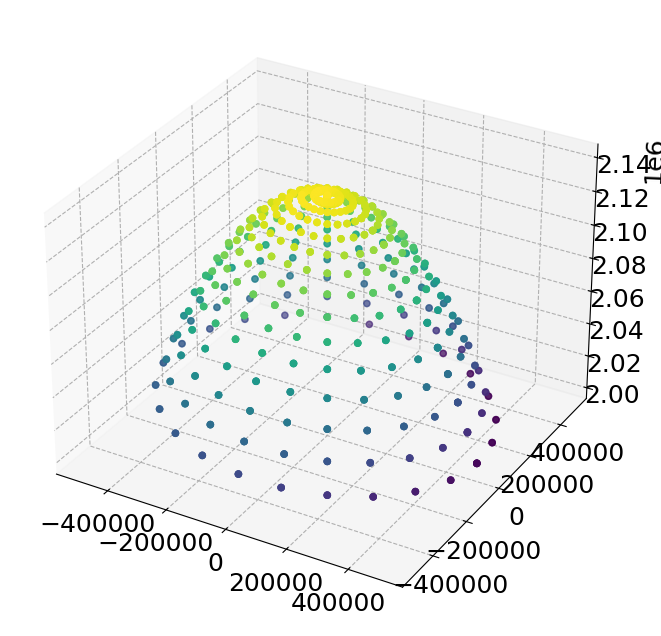

In [31]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')

A1 = np.radians(df['SmarAct_Meas_Angle_1'])
A2 = np.radians(df['SmarAct_Meas_Angle_2'])
R = np.abs(df[f'{probe}_Raw_Z'])
Cs = df[f'{probe}_Raw_Z']

Xs = R * np.sin(A1)*np.cos(A2)
Ys = R * np.sin(A1)*np.sin(A2)
Zs = R * np.cos(A1)

ax.scatter(Xs, Ys, Zs, c=Cs)

In [32]:
# plotly
# B = 'X'
# B = 'X'
B = 'Z'

# dtheta = 0
dtheta = -2

A1 = np.radians(df['SmarAct_Meas_Angle_1']+dtheta)
A2 = np.radians(df['SmarAct_Meas_Angle_2'])
A1_deg = df['SmarAct_Meas_Angle_1']+dtheta
A2_deg = df['SmarAct_Meas_Angle_2']
R = np.abs(df[f'{probe}_Raw_{B}'])
Cs = df[f'{probe}_Raw_{B}']

Xs = R * np.sin(A1)*np.cos(A2)
Ys = R * np.sin(A1)*np.sin(A2)
Zs = R * np.cos(A1)

# Calculate min and max across all axes for equal scaling
#xyz_min = min(np.min(Xs), np.min(Ys), np.min(Zs))
#xyz_max = max(np.max(Xs), np.max(Ys), np.max(Zs))
#range_xyz = [xyz_min, xyz_max]
# Compute global center and range
all_min = min(np.min(Xs), np.min(Ys), np.min(Zs))
all_max = max(np.max(Xs), np.max(Ys), np.max(Zs))
vec_min = np.array([np.min(Xs), np.min(Ys), np.min(Zs)])
vec_max = np.array([np.max(Xs), np.max(Ys), np.max(Zs)])
#center = (all_min + all_max) / 2
center = (vec_min + vec_max) / 2
radius = (all_max - all_min) / 2 * 1.05  # 5% padding
axis_range = [[i1, i2] for i1, i2 in zip(center - radius, center + radius)]

fig = go.Figure(data=[go.Scatter3d(
    x=Xs,
    y=Ys,
    z=Zs,
    mode='markers',
    marker=dict(
        size=5,
        color=Cs,                # set color equal to a variable
        colorscale='Viridis',   # choose a colorscale
        colorbar=dict(title='C')  # add colorbar
    ),
    customdata=np.stack((A1_deg, A2_deg), axis=-1),
    hovertemplate=(
        "X: %{x}<br>" +
        "Y: %{y}<br>" +
        "Z: %{z}<br>" +
        "C: %{marker.color}<br>" +
        "A1: %{customdata[0]}<br>" +
        "A2: %{customdata[1]}<br>" +
        "<extra></extra>"  # suppress secondary box
    ),
)])

fig.update_layout(
    scene=dict(
        xaxis=dict(title='X', range=axis_range[0]),
        yaxis=dict(title='Y', range=axis_range[1]),
        zaxis=dict(title='Z', range=axis_range[2]),
        aspectmode='cube'  # Enforces equal scaling
    ),
    margin=dict(l=0, r=0, b=0, t=0)
)

#fig.show()

In [33]:
plot(fig)

'temp-plot.html'

In [34]:
vec_max

[GFX1-]: More than 2 GPUs detected via PCI, secondary GPU is arbitrary



array([ 429532.85858945,  430421.05925159, 2137986.        ])

In [35]:
axis_range

[[-1352073.8156639675, 1348048.0450254239],
 [-1351207.8777894343, 1348913.982899957],
 [728594.1150465261, 3428715.9757359177]]

In [36]:
center

ATTENTION: default value of option mesa_glthread overridden by environment.


array([-2.01288532e+03, -1.14694744e+03,  2.07865505e+06])

In [37]:
radius

1350060.9303446957

In [38]:
axis_range

[[-1352073.8156639675, 1348048.0450254239],
 [-1351207.8777894343, 1348913.982899957],
 [728594.1150465261, 3428715.9757359177]]

In [39]:
np.arcsin()

TypeError: arcsin() takes from 1 to 2 positional arguments but 0 were given

In [ ]:
# flatten the last plot
# B = 'X'
# B = 'X'
B = 'Z'

# dtheta = 0
#dtheta = -2
dtheta = -2.75

A1 = np.radians(df['SmarAct_Meas_Angle_1'] + dtheta)
A2 = np.radians(df['SmarAct_Meas_Angle_2'])
A1_deg = df['SmarAct_Meas_Angle_1'] + dtheta
A2_deg = df['SmarAct_Meas_Angle_2']
#R = np.abs(df[f'{probe}_Raw_X'])
# R = np.abs(df[f'{probe}_Raw_Y'])
R = np.abs(df[f'{probe}_Raw_{B}'].values)
Cs = df[f'{probe}_Raw_{B}'].values

Xs = R * np.sin(A1)*np.cos(A2)
Ys = R * np.sin(A1)*np.sin(A2)
##Zs = R * np.cos(A1)

imap = np.where(R > np.max(R)*0.9999)[0]

fig, ax = plt.subplots()

sc = ax.scatter(Xs, Ys, c=Cs)
cb = fig.colorbar(sc, label=f'Voltage {B} [ADC]')

ax. scatter(Xs[imap], Ys[imap], s=5, marker='+', c='red')

ax.set_xlabel('x = V * sin(theta) * cos(phi)')
ax.set_ylabel('y = V * sin(theta) * sin(phi)')

In [ ]:
imap

In [ ]:
Xs.shape

In [ ]:
imap.shape

In [ ]:
R

In [ ]:
# zoom to center
ax.set_xlim([-100, 100])
ax.set_ylim([-100, 100])
fig